<a href="https://colab.research.google.com/github/Ramilopez99/ScrapyFaces/blob/main/Scrapy_faces.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Scrapy

## Instalación de Scrapy y creación del proyecto

In [ ]:
# instalación de Scrapy
!pip install Scrapy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 271 kB 5.2 MB/s 
     |████████████████████████████████| 3.1 MB 50.8 MB/s 
     |████████████████████████████████| 4.0 MB 16.3 MB/s 
     |████████████████████████████████| 261 kB 24.2 MB/s 
     |████████████████████████████████| 93 kB 221 kB/s 
     |████████████████████████████████| 57 kB 923 kB/s 
     |████████████████████████████████| 74 kB 1.9 MB/s 
  Created wheel for PyDispatcher: filename=PyDispatcher-2.0.6-py3-none-any.whl size=11959 sha256=c5fd4717d2a4e1966cc8ee271973e5f1e08f51e1984390e04f10bca7dc70b661
  Stored in directory: /root/.cache/pip/wheels/dc/b9/4a/948b1176e084b9e3f85e4ffc3d08f817b1fdf0d973bbb94f81
Successfully built PyDispatcher


In [ ]:
# creación del proyecto
!scrapy startproject project_faces scrapy

New Scrapy project 'project_faces', using template directory '/usr/local/lib/python3.8/dist-packages/scrapy/templates/project', created in:
    /content/scrapy

You can start your first spider with:
    cd scrapy
    scrapy genspider example example.com


In [ ]:
# creación del spider
!cd scrapy/project_faces && scrapy genspider FindFaces https://www.elfutboldeayer.com/blog/

Created spider 'FindFaces' using template 'basic' in module:
  project_faces.spiders.FindFaces


In [ ]:
#creacion de la carpeta results
!cd /content/scrapy/project_faces && mkdir results 

## Edición de path/to/settings.py



*   USER_AGENT
*   ROBOTSTXT_OBEY
*   DEFAULT_REQUEST_HEADERS



In [ ]:
%%writefile scrapy/project_faces/settings.py

BOT_NAME = 'project_faces'

SPIDER_MODULES = ['project_faces.spiders']
NEWSPIDER_MODULE = 'project_faces.spiders'

USER_AGENT = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/107.0.0.0 Safari/537.36'

ROBOTSTXT_OBEY = False

DEFAULT_REQUEST_HEADERS = {
   'Accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,*/*;q=0.8',
   'Accept-Language': 'es',
}

REQUEST_FINGERPRINTER_IMPLEMENTATION = '2.7'
TWISTED_REACTOR = 'twisted.internet.asyncioreactor.AsyncioSelectorReactor'

Overwriting scrapy/project_faces/settings.py


##Implementación del spyder

In [ ]:
%%writefile scrapy/project_faces/spiders/FindFaces.py
import scrapy

class FindfacesSpider(scrapy.Spider):
    name = 'FindFaces'
    allowed_domains = ['www.elfutboldeayer.com']
    start_urls = ['https://www.elfutboldeayer.com/blog/']
    pages = 1

    def parse(self, response):
        articles = response.css('div.j-blog-meta')
        print('numero de entradas:', len(articles))
        for article in articles:
            href = article.css('a::attr(href)').get()
            print('href', href)
            yield scrapy.Request(href, callback = self.parse_article, meta={'href': href})
        
        next_page = response.css('div.load-more-blog-posts-content > p')
        self.pages += 1
        if next_page and self.pages < 3:
            next_href = next_page.css('a::attr(href)').get()
            yield scrapy.Request(next_href)

    def parse_article(self, response):
        href = response.meta.get('href')
        print(href)
        element = response.css('figure.cc-imagewrapper.cc-m-image-align-1')
        img = element.css('a::attr(data-href)').get()
        yield {
            'href': href,
            'img': img
        }

Overwriting scrapy/project_faces/spiders/FindFaces.py


## Ejecución del spider

In [ ]:
!cd /content/scrapy/project_faces/results && scrapy crawl FindFaces -O faces.json

2022-12-14 19:39:19 [scrapy.utils.log] INFO: Scrapy 2.7.1 started (bot: project_faces)
2022-12-14 19:39:19 [scrapy.utils.log] INFO: Versions: lxml 4.9.1.0, libxml2 2.9.14, cssselect 1.2.0, parsel 1.7.0, w3lib 2.1.1, Twisted 22.10.0, Python 3.8.16 (default, Dec  7 2022, 01:12:13) - [GCC 7.5.0], pyOpenSSL 22.1.0 (OpenSSL 3.0.7 1 Nov 2022), cryptography 38.0.4, Platform Linux-5.10.133+-x86_64-with-glibc2.27
2022-12-14 19:39:19 [scrapy.crawler] INFO: Overridden settings:
{'BOT_NAME': 'project_faces',
 'NEWSPIDER_MODULE': 'project_faces.spiders',
 'REQUEST_FINGERPRINTER_IMPLEMENTATION': '2.7',
 'SPIDER_MODULES': ['project_faces.spiders'],
 'TWISTED_REACTOR': 'twisted.internet.asyncioreactor.AsyncioSelectorReactor',
 'USER_AGENT': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 '
               '(KHTML, like Gecko) Chrome/107.0.0.0 Safari/537.36'}
2022-12-14 19:39:19 [asyncio] DEBUG: Using selector: EpollSelector
2022-12-14 19:39:19 [scrapy.utils.log] DEBUG: Using reactor: twis

# Procesando las caras de las imágenes

In [ ]:
from io import BytesIO
import cv2
from PIL import Image
import json
import numpy as np
import requests

## Cargar las imagenes de las urls

In [ ]:
# Se abre el archivo JSON que contiene información sobre las imágenes a analizar y se carga su contenido en una variable data.
json_file = '/content/scrapy/project_faces/results/faces.json'
with open(json_file, 'r') as f:
    data = json.load(f)

# Se crea una lista vacía llamada images que se usará para almacenar las imágenes una vez que se hayan descargado y convertido a un formato que pueda ser procesado por OpenCV.
images = []

# Se itera sobre cada elemento en la lista data y se extrae la URL de la imagen del elemento actual.
for item in data:
    url = item['img']

    # La imagen se descarga y se convierte en un NumpyArray.
    img = Image.open(BytesIO(requests.get(url).content))
    img = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2RGBA)

    # La imagen se agrega a la lista images.
    images.append(img)


## Mostrar las imagenes

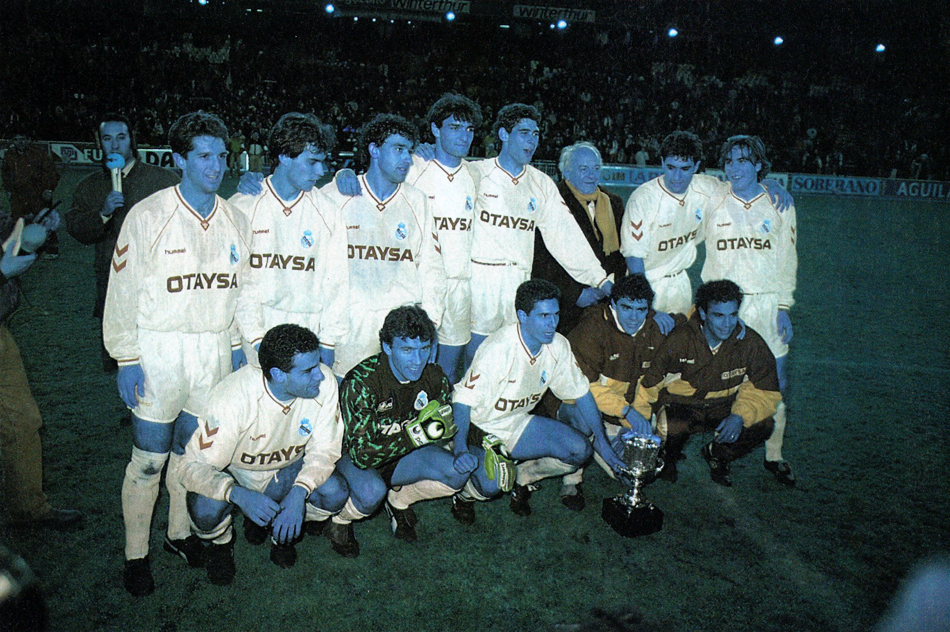

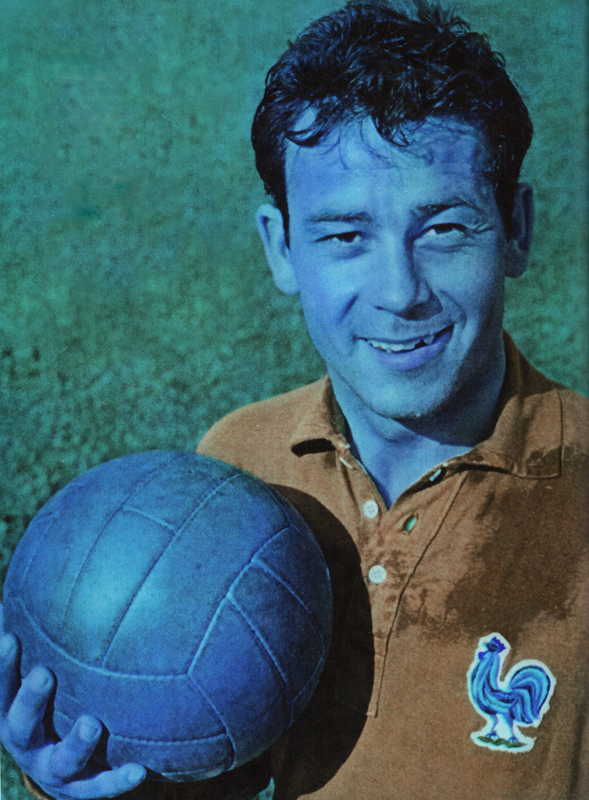

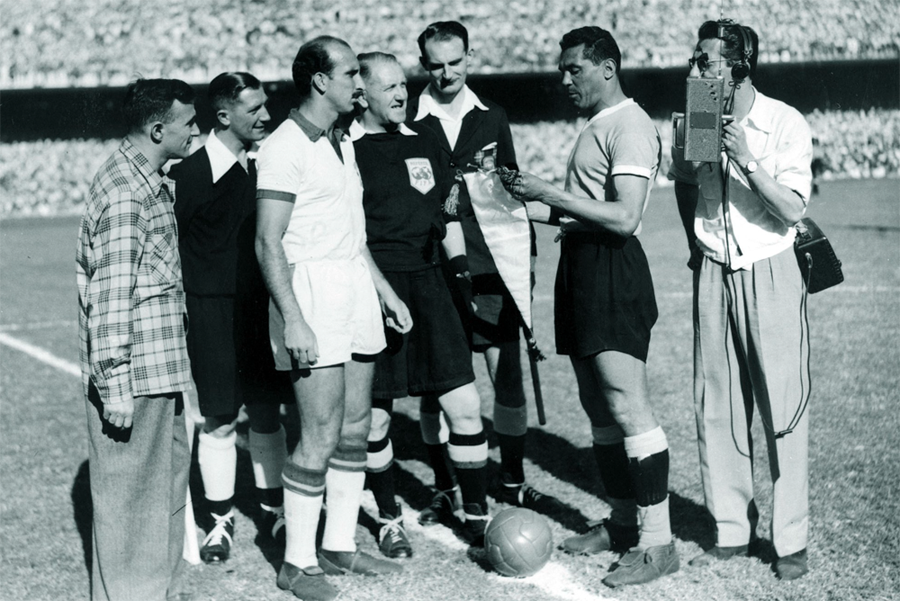

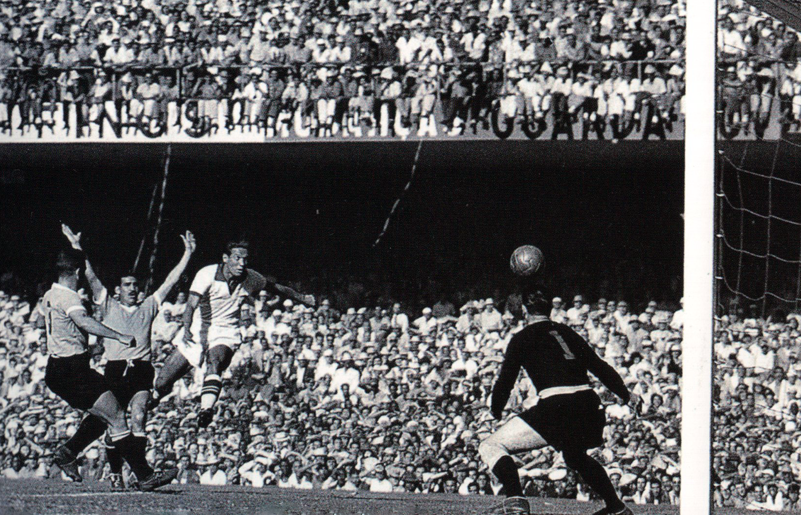

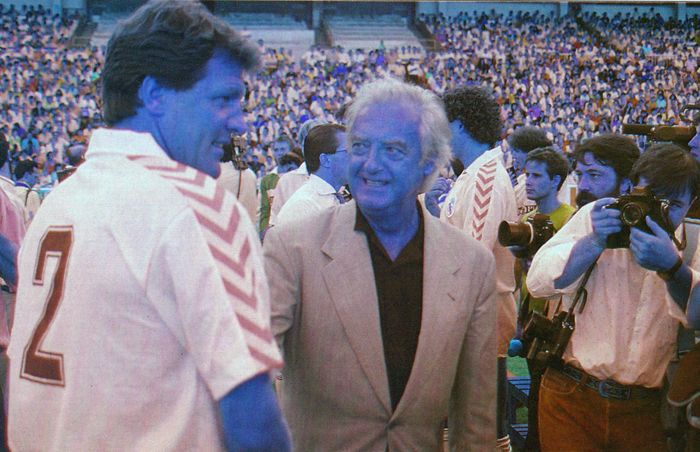

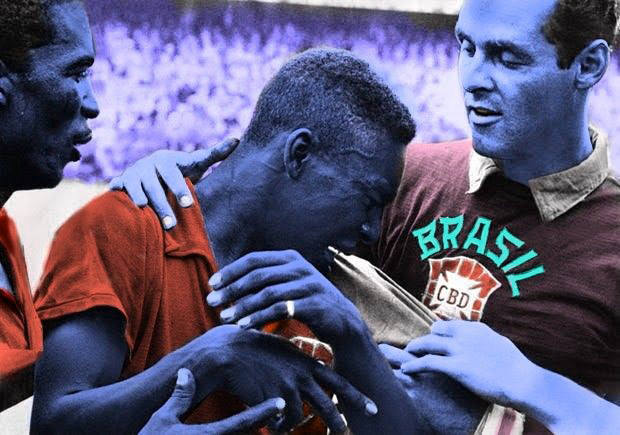

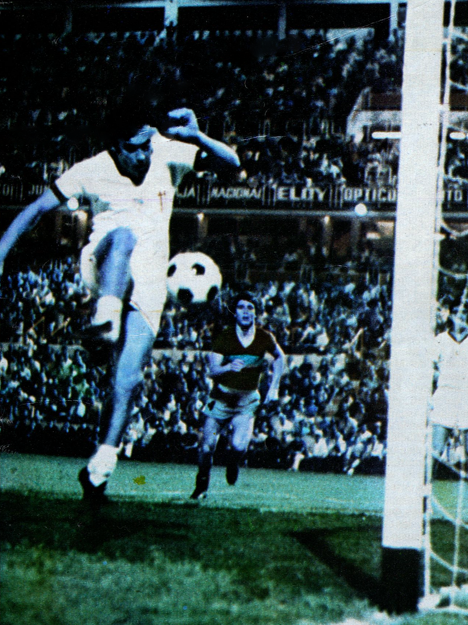

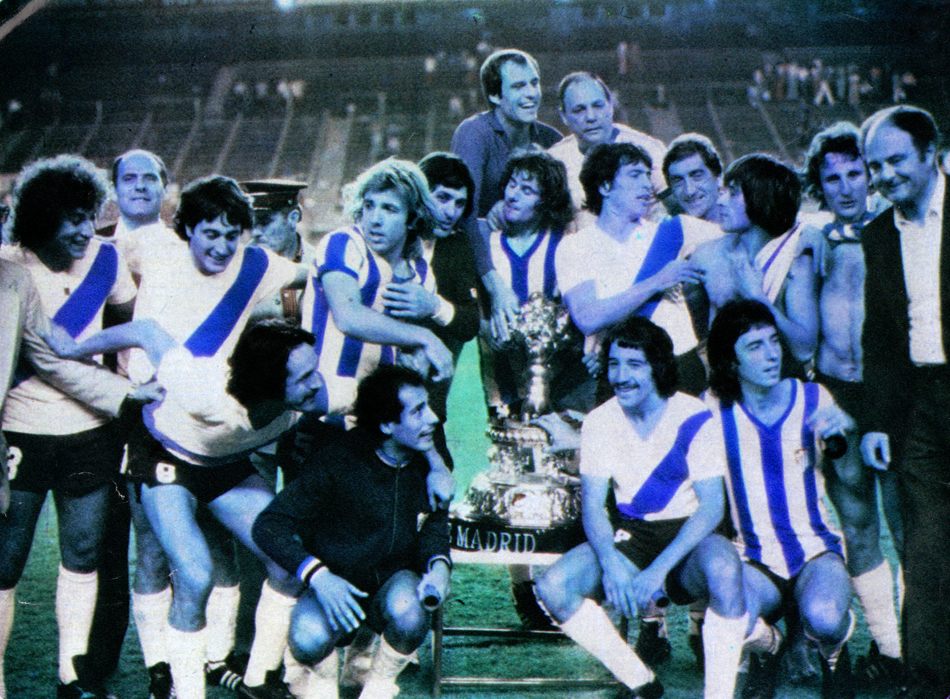

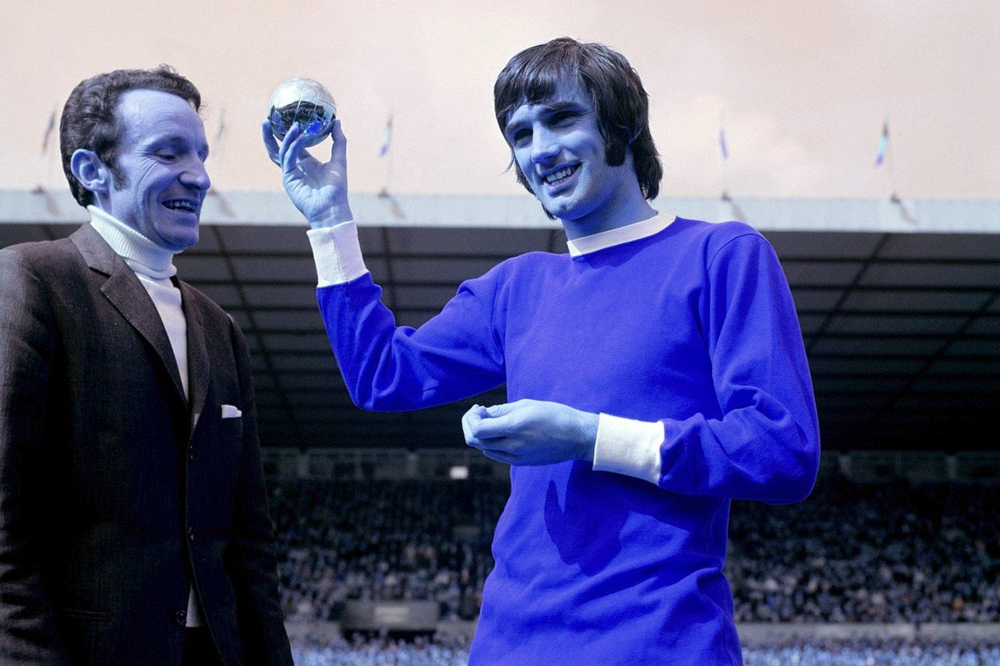

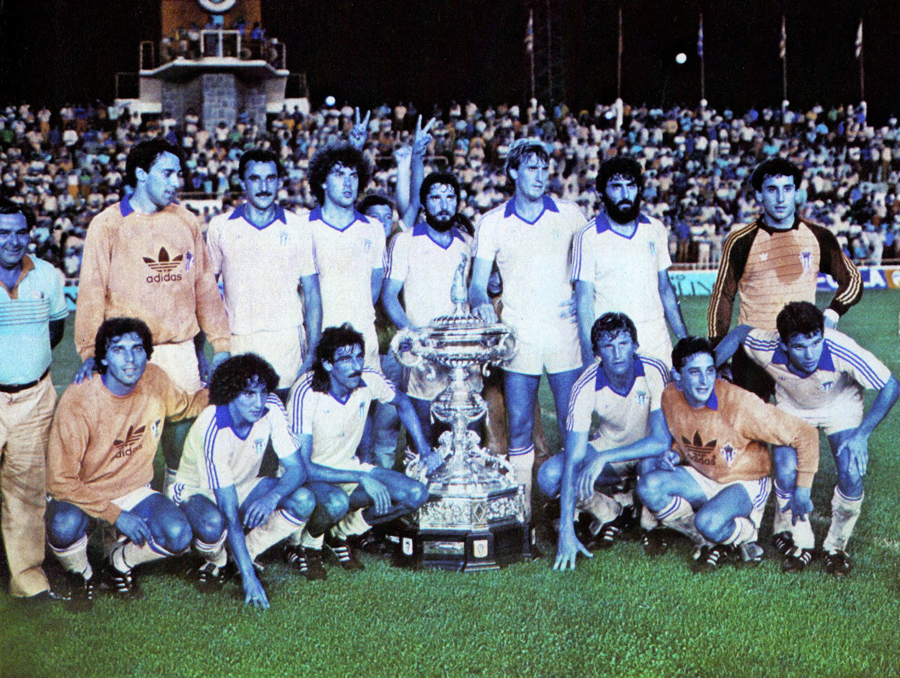

In [ ]:
from google.colab.patches import cv2_imshow

for img in images:
    cv2_imshow(img)

## Detectar los rostros

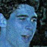

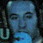

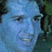

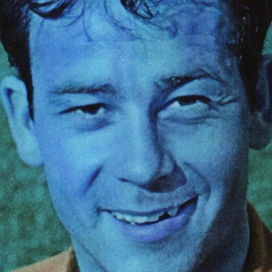

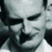

...

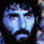

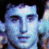

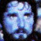

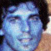

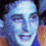

Found a total of 21 faces!


In [ ]:
# Un objeto CascadeClassifier de OpenCV se crea para detectar rostros en las imágenes.
faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")

faces_list = []

# Se itera sobre cada imagen en la lista images.
for img in images:

    # La imagen se convierte a escala de grises.
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Se usa el clasificador de cascada para detectar rostros en la imagen en escala de grises.
    faces = faceCascade.detectMultiScale(
            gray,
            scaleFactor = 1.2,
            minNeighbors = 8,
            minSize = (30, 30)
    )

    for (pos_x, pos_y, width, height) in faces:
        # Se recorta la cara de la imagen original.
        face_img = img[pos_y:pos_y+height, pos_x:pos_x+width]
        #Se almacenan en una lista las imagenes recortadas
        faces_list.append(face_img)
        #Se muestran las imagenes recortadas
        cv2_imshow(face_img)  

# Una vez que se han analizado todas las imágenes, se imprime el número total de rostros detectados en todas las imágenes.
print("Found a total of {0} faces!".format(len(faces_list)))

## Crear Collage de caras

In [ ]:
def create_square_image(faces_list, size=(100, 100)):
    # Calculo cuántas imágenes necesitos agregar a la lista para que el número total sea un cuadrado perfecto
    num_faces = len(faces_list)
    required_num_faces = int(np.ceil(np.sqrt(num_faces)))**2
    num_faces_to_add = required_num_faces - num_faces

    # Agrego imágenes a la lista hasta que el número total sea un cuadrado perfecto
    for i in range(num_faces_to_add):
        faces_list.append(faces_list[i % num_faces])

    # Calculo el número de columnas 
    num_cols = int(np.ceil(np.sqrt(len(faces_list))))
    
    square_img = []
    cont = 1
    new_row = True

    for img in faces_list:
        # Hago que todas las imagenes tengan la misma dimension
        img = np.asarray(Image.fromarray(img).resize(size))
        if new_row:
            row = img
            new_row = False
        else:
            row = np.hstack ([row, img])
        if cont == num_cols:
            square_img = row
            new_row = True
        elif cont % num_cols == 0:
            square_img = np.vstack([square_img, row])
            new_row = True
        cont += 1

    return Image.fromarray(square_img)

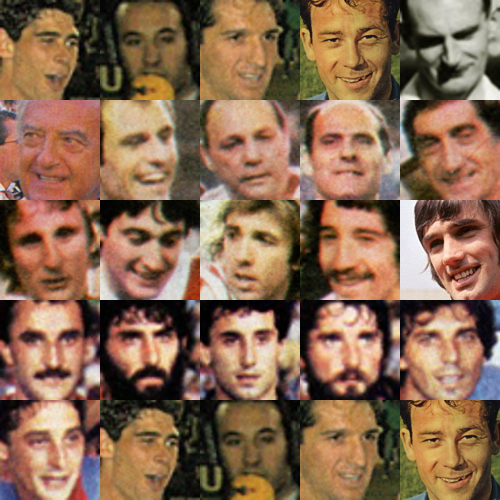

In [ ]:
square_image = create_square_image(faces_list)
square_image